### Imports

In [1]:
%load_ext autoreload
%autoreload 2
#%matplotlib notebook
%matplotlib inline

In [2]:
# Computational packages
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import tqdm
#import cv2 as cv

# General packages
import datetime
import sys
import os

# custom packages
import ratsimulator
from ratsimulator.Environment import Rectangle
import spatial_maps as sm # CINPLA spatial maps

# avoid adding multiple relave paths to sys.path
sys.path.append("../../src") if "../../src" not in sys.path else None 
from PlaceCells import PlaceCells
from Models import SorscherRNN
from Experiment import Experiment
from methods import *
from datahandling import *
from stats import *
from astropy.convolution import Gaussian2DKernel, convolve

import umap
import plotly.graph_objects as go
import plotly.offline as pyo
# Set notebook mode to work in offline
pyo.init_notebook_mode()

In [80]:
plt.rcParams.update({'figure.figsize': (3,2), 'figure.dpi': 150, 'legend.frameon': False})
# sns.set_style('white', {'legend.frameon': False})
palette = {'setosa': '#7fc97f', 'versicolor': '#beaed4', 'virginica': '#fdc086'}

def savefig(fname):
    plt.savefig(f'{fname}.svg', bbox_inches='tight', transparent=True)
    
"""
sns.countplot(data=df, x=df.variety, palette=palette)
plt.xticks(rotation=45)
sns.despine()
plt.xlabel('')
savefig('count')
"""

"\nsns.countplot(data=df, x=df.variety, palette=palette)\nplt.xticks(rotation=45)\nsns.despine()\nplt.xlabel('')\nsavefig('count')\n"

In [4]:
# aggregate methods for finding different statistics given a stack of ratemaps

def find_spacings(maps):
     return np.array([list(map(lambda x: grid_spacing(x)[0], maps[i])) for i in range(len(maps))])

def find_orientations(maps):
    return np.array([list(map(lambda x: grid_orientation(x)[0], maps[i])) for i in range(len(maps))])

def find_shifts(maps):
    """Find (upper triangular) array of relative shifts
    
    params:
    maps (np.ndarray): ratemaps in each environment, shape (n_envs, n_maps, nx, ny)
    where n_envs is number of environments, n_cells the number of ratemaps,
    nx, ny the pixel dimension of each map.
    
    returns:
    relative_shifts (np.array): upper triangular array of shifts 
        between envs, shape (n_envs, n_envs, n_cells , n_cells, 2)
    """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    mb_size = 50
    N = maps.shape[1]
    n_envs = len(maps)
    relative_shifts = np.zeros((n_envs, n_envs, N, N, 2))
    pbar = tqdm.tqdm(total = int(n_envs*(n_envs+1)/2), position = 0, ncols = 100)
    for env_i in range(n_envs):
        for env_j in range(env_i, n_envs):
            pbar.update()
            for mb in range(0,N,mb_size):
                # 
                ratemaps_i = torch.tensor(maps[env_i,mb:mb+mb_size], device=device)
                ratemaps_j = torch.tensor(maps[env_j], device=device)
                corrs = torch.nn.functional.conv2d(ratemaps_i[:,None], ratemaps_j[:,None], padding='same').detach().cpu().numpy()
                for ki in range(mb_size):
                    for kj in range(N):
                        #print(mb+ki) # slicing error?
                        relative_shifts[env_i, env_j,mb+ki,kj] = phase_shift2(corrs[ki,kj])
    pbar.close()
    return relative_shifts

In [95]:
# and some handy plotting methods

def plot_orientations(thetas, kappa = 50, **kwargs):
    #fig,ax = plt.subplots(figsize=(14,6),subplot_kw={'projection': 'polar'})
    fig,ax = plt.subplots(figsize=(14,6))
    plt.hist(thetas.flatten(), density=True, **kwargs)
    phi = np.linspace(0, 2*np.pi, 1001)
    for i, theta in enumerate(thetas):
        von_mises_pdf = circular_kernel(theta, kappa=kappa)
        ax.plot(phi, von_mises_pdf(phi))
    plt.xlabel('Radians')
    plt.ylabel('Density')
    plt.title('Grid orientation (circular plot)')

def plot_spacings(spacings, bw_adjust = 0.5, **kwargs):
    plt.figure(figsize=(14,6))
    plt.hist(spacings.flatten(), density=True, **kwargs)
    sns.kdeplot(data=spacings.T, bw_adjust=bw_adjust, fill=True, alpha=0.35, 
                legend = False, palette='inferno', common_norm=False, linewidth=1)
    plt.xlabel('Meters [m]')
    plt.title('Peak Spacing')


## First, we create synthetic data to provide a baseline and verify our methods

In [6]:
def synth_grid(xx, yy, phase = 0, orientation = 0, f = 3):
    """ Create ratemaps for n synthetic grid cells
    params:
    xx, yy (np.ndarray): coordinate grids of shape (nx, ny)
    phase (np.array): phase shifts of shape (n,)
    orientation (float): orientation of grid cells. Shared by all n cells
    f (float): grid frequency
    """
    
    theta = np.array([i*np.pi/3 for i in range(3)]) + orientation
    kx = np.cos(theta)
    ky = np.sin(theta)
    
    x_phase = xx[None] + phase[:,0,None,None]
    y_phase = yy[None] + phase[:,1,None,None]
    inner_prod = kx[None,:,None,None]*x_phase[:,None] + ky[None,:,None,None]*y_phase[:,None]
    gc = np.clip(1/3*np.sum(np.cos(2*np.pi*f*inner_prod), axis = 1), 0, 1)
    return gc


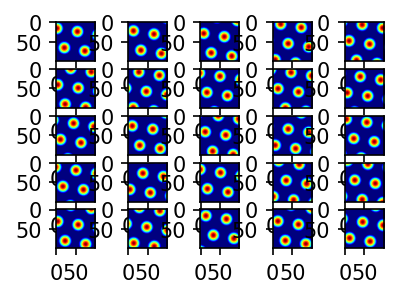

In [53]:
#n = 32
n = 100
x = np.linspace(0, 2.2, n) # Boxsize same as default
y = np.linspace(0, 2.2, n)
xx, yy = np.meshgrid(x,y)

# create modules
# each with unique random phases and orientations
n_envs = 1
n_mods = 1 # one for umap
cells_per_mod = 500
# every cell has a random phase
phases = np.random.uniform(-2, 2, (n_mods, cells_per_mod, 2))
# every module has a shared orientation
orientations = np.random.uniform(0, 2*np.pi, n_mods) # random orientation
# save resulting orientation
actual_orientations = np.zeros((n_envs, n_mods)) # save shifted orientations

# each module has a unique phase and orientation shift in each env.
phase_shifts = np.random.uniform(-4, 4, (n_envs, n_mods, 2))
orientation_shifts = np.random.uniform(0, np.pi/3, (n_envs, n_mods))

synth_maps = np.zeros((n_envs, n_mods*cells_per_mod, n, n))
fs = [1 for i in range(n_mods)] # grid frequency the same for all (for now)
#fs[1] = 0.75

for i in range(n_envs):
    for j in range(n_mods):
        phase = phases[j] + phase_shifts[i,j][None] # modules phase shift coherently
        actual_orientations[i,j] =  orientations[j] + orientation_shifts[i,j] # and rotate coherently
        gc = synth_grid(xx, yy, phase, actual_orientations[i,j], f = fs[j]) # create ratemaps
        synth_maps[i,j*cells_per_mod: (j+1)*cells_per_mod] = gc # save module ratemap activity

# plot a random selection of cells         
env = 0
m = 5
fig, ax = plt.subplots(m, m)
for i in range(m**2):
    row = i // m
    col = i % m
    show = np.random.randint(synth_maps.shape[1])
    ax[row, col].imshow(synth_maps[env,show], cmap = "jet")
plt.show()

### Then compute & plot grid spacing and orientation

In [54]:
synth_spacings = find_spacings(synth_maps)
synth_orientations = find_orientations(synth_maps)

(0.0, 6.283185307179586)

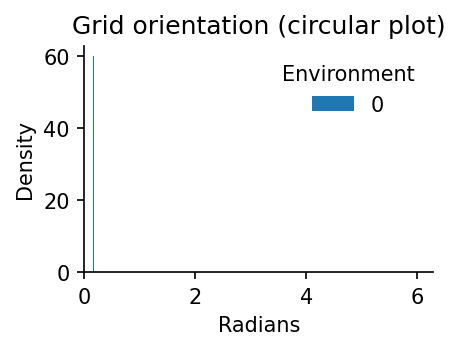

In [84]:
plot_orientations(synth_orientations, kappa = 100) # adjust kappa as needed for sharpness

# set additional plot params
sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(synth_orientations))], frameon = False)
plt.xlim([0, 2*np.pi])
#plt.locator_params(nbins=4)

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")
#plt.savefig("./grid-orientations.pdf")

(0.0, 3.111269837220809)

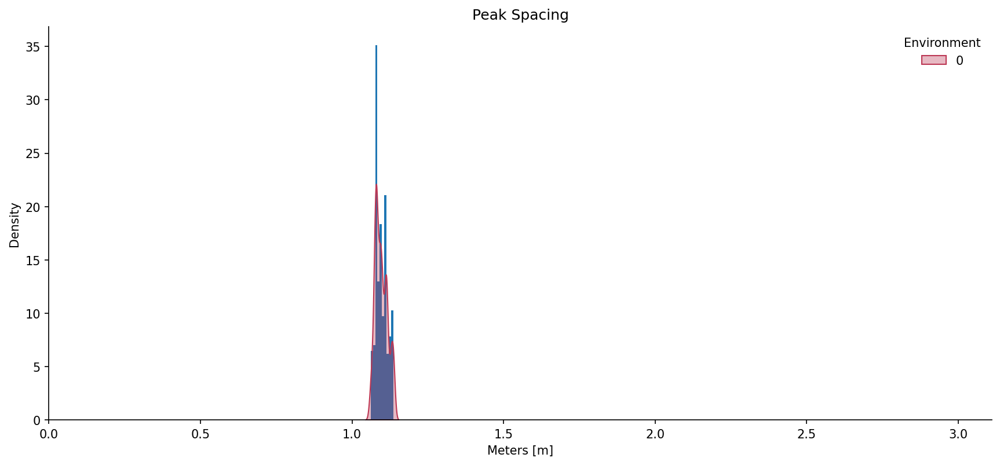

In [70]:
plot_spacings(synth_spacings, bw_adjust = 1.0) 

sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(synth_spacings))], frameon = False)

# hardcoded boxsize
max_spacing = np.sqrt(2*2.2**2)  # synth box diagonal
plt.xlim([0, max_spacing])

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")

In [57]:
synth_maps.shape

(1, 500, 100, 100)

In [58]:

n_envs = len(synth_maps)
if n_envs > 2:
    # do violin plot for synthetic data
    N = synth_maps.shape[1]
    shifts = np.zeros((n_envs,n_envs, N))
    for i in range(n_envs):
        for j in range(i, n_envs):
            shifts[i,j] = np.array(list(map(lambda x: phase_shift(*x), zip(synth_maps[i],synth_maps[j]))))
    upper_flat_triangle = shifts[np.triu_indices(shifts.shape[0],k=1)] 

    data = []
    for env_phase in upper_flat_triangle:
        data.append(env_phase[~np.isnan(env_phase)])
    fig,ax = plt.subplots()
    ax.violinplot(data)


## Load Experiment

In [103]:
#base_path = "/home/users/vemundss/"
base_path = "/mnt/WD12TB-HDD"
experiment = Experiment(name = '3ME_large_batch', base_path=base_path)
experiment.setup()

# detach experiment specifics
params = experiment.params
environments = experiment.environments
agents = experiment.agents
pc_ensembles = experiment.pc_ensembles
paths = experiment.paths

Experiment <3ME_large_batch> already EXISTS. Loading experiment settings!
Loading experiment details
This experiment has ALREADY been setup - SKIPPING.


### Load and smooth all ratemaps for all environments

In [104]:
kernel = Gaussian2DKernel(x_stddev=1)
ratemaps = []
for env_i in range(len(environments)):
    with open(experiment.paths['ratemaps'] / f'env_{env_i}' / filenames(experiment.paths['ratemaps'] / f'env_{env_i}')[-1], "rb") as f:
        ratemaps.append(convolve(pickle.load(f), kernel.array[None]))

ratemaps = np.concatenate(ratemaps)

In [105]:
scores = []
score_files = os.listdir(experiment.paths["grid_scores"])
for fname in score_files:
    if not "novel" in fname:
        with open(f"{experiment.paths['grid_scores']}/{fname}", "rb") as f:
            print(f"{experiment.paths['grid_scores']}/{fname}")

            scores.append(pickle.load(f))
scores = np.concatenate(scores)

/mnt/WD12TB-HDD/data/emergent-grid-cells/3ME_large_batch/grid_scores/00999_env_1.pkl
/mnt/WD12TB-HDD/data/emergent-grid-cells/3ME_large_batch/grid_scores/00999_env_0.pkl
/mnt/WD12TB-HDD/data/emergent-grid-cells/3ME_large_batch/grid_scores/00999_env_2.pkl


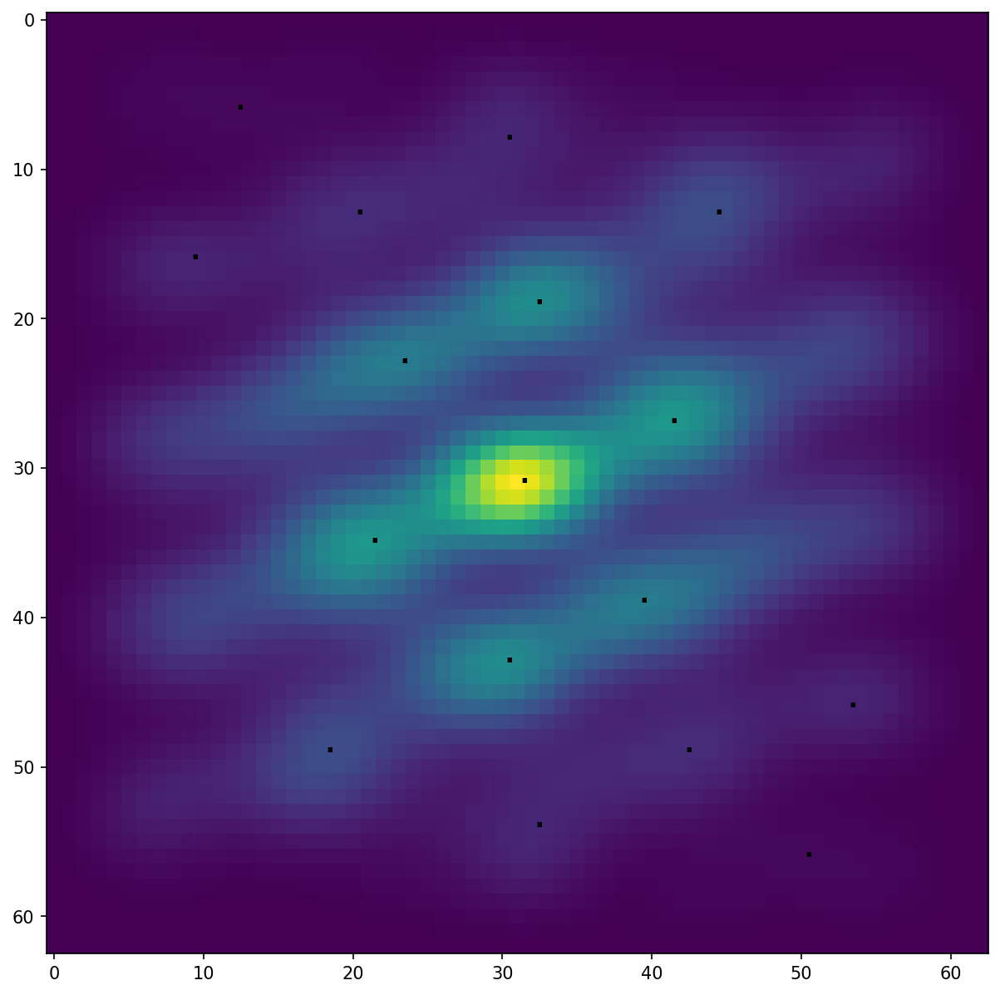

In [106]:
unit=0 # show a particular cell
img = scipy.signal.correlate(ratemaps[unit], ratemaps[unit], mode='full')

peaks = sm.find_peaks(img)
fig,ax = plt.subplots(figsize=(10,10))
ax.imshow(img.T)

for peak in peaks:
    ax.annotate('.', xy=peak, fontsize=25)

In [107]:
def env_split(stats, Ng=4096):
    # stack ratemaps by environment
    env_stat = []
    for env_i in range(len(environments)):
        tmp = stats[Ng*env_i:Ng*(env_i+1)]
        env_stat.append(tmp)
    return np.array(env_stat)

scores = env_split(scores)
ratemaps = env_split(ratemaps)

Now we select cells with high grid scores in *all* environments

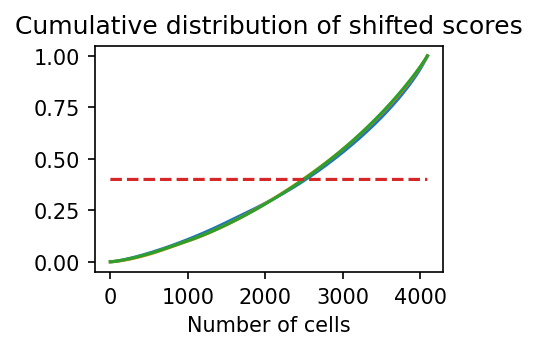

Grid score thresholds for 40.0th percentile: [0.14011492 0.32811868 0.35624636]


IndexError: boolean index did not match indexed array along dimension 1; dimension is 4096 but corresponding boolean dimension is 3

In [139]:
# procedure: 
# - first, grid scores can be negative, so simply shift minimum to zero.
# - sort scores
# - compute cumulative distribution
# - determine threshold score to be in top x percentile based on index from cumulative dist.
# - shift threshold back to actual score
# - mask out cells above threshold

shifted = scores - np.amin(scores, axis = -1)[:,None] # shift to be above zero.
sorted_scores = np.sort(shifted, axis = -1)

cumulative_score = np.cumsum(sorted_scores, axis = -1)/np.sum(shifted, axis = -1, keepdims = True)


percentile_value = 0.4 # top 30 % 
plt.plot(cumulative_score.T)
plt.plot(np.arange(cumulative_score.shape[1]), percentile_value*np.ones(cumulative_score.shape[1]), "--")
plt.xlabel("Number of cells")
plt.title("Cumulative distribution of shifted scores")
plt.show()

cumulative_mask = cumulative_score > percentile_value
# thresh is score required to be in top x percentile in every env.
thresh = [np.amin(sorted_scores[i,cumulative_mask[i]]) for i in range(len(cumulative_mask))]

actual_thresh = thresh + np.amin(scores, axis = -1) # shift back
print(f"Grid score thresholds for {percentile_value*100}th percentile:", actual_thresh)
# mask must be true across environments, hence prod
accept_mask = np.array([scores[i] > actual_thresh[i] for i in range(len(scores))])

accepted_maps = [ratemaps[:,accept_mask] ]
print("# Accepted cells:", np.sum(accept_mask))

In [140]:
ratemaps.shape, accept_mask.shape

((3, 4096, 32, 32), (3, 4096))

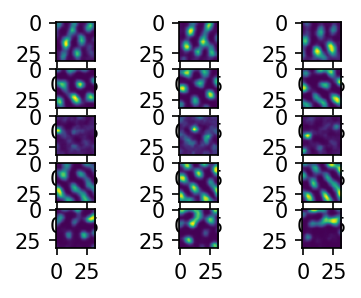

In [133]:
# plot a selection of accepted cells across envs
fig, ax = plt.subplots(5, 3)
for i in range(5):
    for j in range(len(accepted_maps)):
        ax[i,j].imshow(accepted_maps[j,i])
plt.show()

In [126]:
grid_spacings = find_spacings(accepted_maps)
grid_orientations = find_orientations(accepted_maps)

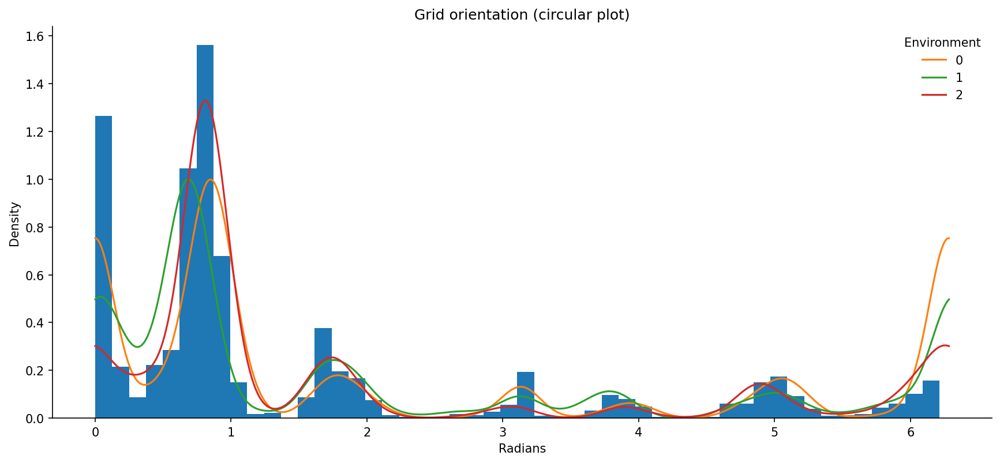

In [127]:
no_orientation = np.any(np.isnan(grid_orientations), axis = 0) # remove NaNs
safe = grid_orientations[:,~no_orientation]  

plot_orientations(safe, kappa = 50, bins=50) # adjust kappa as needed for sharpness

# set additional plot params
sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(grid_orientations))], frameon = False)
#plt.xlim([0, 2*np.pi])

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")

(0.0, 3.111269837220809)

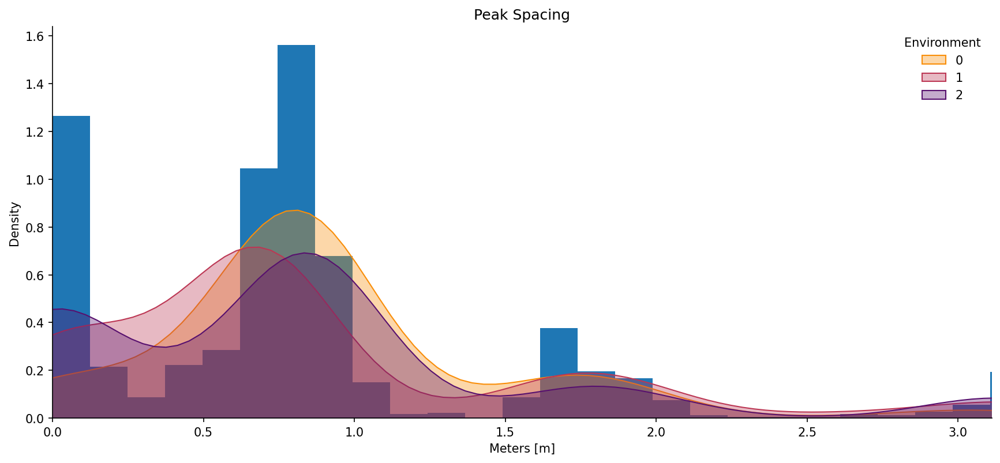

In [128]:
no_spacing = np.any(np.isnan(grid_spacings), axis = 0) # remove NaNs
safe = grid_orientations[:,~no_spacing] 
plot_spacings(safe, bins=50) 

sns.despine() # maybe set these in style sheet instead?
plt.legend(title = "Environment", labels = [i for i in range(len(environments))], frameon = False)

# hardcoded boxsize
max_spacing = np.sqrt(2*2.2**2)  # synth box diagonal
plt.xlim([0, max_spacing])

#loc = "./"
#plt.savefig(f"{loc}synth_orientations.svg")

In [129]:
# only calculate the upper triangular part of the matrix - since the matrix is symmetric,
# the lower triangular part is a copy of the upper triangular
shifts = np.zeros((len(environments),len(environments), accepted_maps.shape[1]))
for i in range(len(environments)):
    for j in range(i, len(environments)):
        shifts[i,j] = np.array(list(map(lambda x: phase_shift(*x), zip(accepted_maps[i],accepted_maps[j]))))
upper_flat_triangle = shifts[np.triu_indices(shifts.shape[0],k=1)]

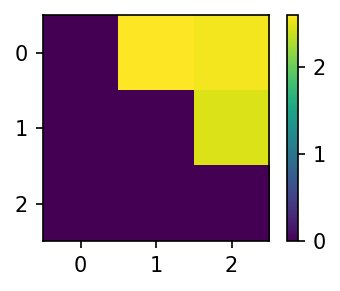

In [114]:
plt.imshow(np.nanmean(shifts,axis=-1))
plt.colorbar()

In [115]:
if n_envs > 2:
    data = []
    for env_phase in upper_flat_triangle:
        data.append(env_phase[~np.isnan(env_phase)])
    fig,ax = plt.subplots()
    ax.violinplot(data)
    labels=['1<->2','1<->3','2<->3']
    ax.set_xticks(np.arange(1, len(labels) + 1), labels=labels)
    plt.xlabel("environment idx")
    plt.ylabel("phase shift")

In [116]:
import plotly.io as pio
pio.renderers.default = 'colab' # or 'notebook' or 'iframe' or 'jupyterlab'

In [117]:
def plot_3d_proj(data, tags):
    fig = go.Figure(data=[go.Scatter3d(
        x=data[:,0],
        y=data[:,1],
        z=data[:,2],
        mode='markers',
        marker=dict(
            size=1,
            color=tags,                # set color to an array/list of desired values
            colorscale='Hsv',   # choose a colorscale
            opacity=0.8
        )
    )])
    # tight layout
    fig.update_scenes(xaxis_visible=False, yaxis_visible=False,zaxis_visible=False )
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()



In [118]:
print(accepted_maps.shape,np.transpose(accepted_maps, (0, -2, -1, 1)).shape)

# transpose and flatten
data = np.reshape(np.transpose(accepted_maps, (0, -2, -1, 1)), (-1, accepted_maps.shape[1]))

fit = umap.UMAP(n_components = 3)
u = fit.fit_transform(data)
plot_3d_proj(u, np.ones(len(data)))
#plt.scatter(u[:,0], u[:,1])

(3, 4096, 32, 32) (3, 32, 32, 4096)


In [29]:
# transpose and flatten
data = np.transpose(synth_maps, (0, 2, 3, 1))
data = np.reshape(data, (-1, n_mods*cells_per_mod))
u = fit.fit_transform(data)
fit = umap.UMAP(n_components = 3)
plot_3d_proj(u, np.ones(len(data))) 
# 3 environments!

## Make a test umap plot using synthetic gc data with one module, points sampled at random

In [30]:
n = 100000 # number of samples
ng = 1000 # number of cells
f = 1 # frequency
x = np.random.uniform(0, 2.2, n)
y = np.random.uniform(0, 2.2, n)

p = np.random.uniform(0, 2.2, (ng, 2)) # phase shift

theta = np.array([i*np.pi/3 for i in range(3)])
kx = np.cos(theta)
ky = np.sin(theta)
xp = x[:,None] - p[None,:,0]
yp = y[:,None] - p[None,:,1]
print(xp.shape, yp.shape)

inner_prod = kx[None,:,None]*xp[:,None] + ky[None,:,None]*yp[:,None]
gc = np.clip(1/3*np.sum(np.cos(2*np.pi*f*inner_prod), axis = 1), 0, 1)


(100000, 1000) (100000, 1000)


In [31]:
fit = umap.UMAP(n_components = 3)
u = fit.fit_transform(gc)
plot_3d_proj(u, np.ones(len(data)))


In [32]:
# Then we test plotting the ratemaps!
res = scipy.stats.binned_statistic_2d(x,y, gc.T, bins = 90)

In [33]:
fit = umap.UMAP(n_components = 3)
print(res.statistic.shape)
data = np.reshape(res.statistic, (ng, -1)).T
print(data.shape)
u = fit.fit_transform(data)
plot_3d_proj(u, np.ones(len(data)))


(1000, 90, 90)
(8100, 1000)


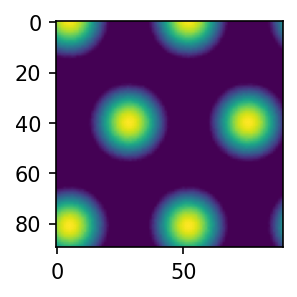

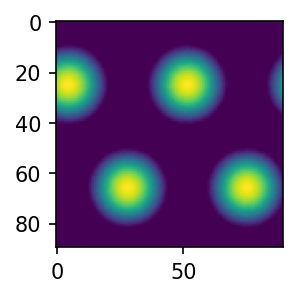

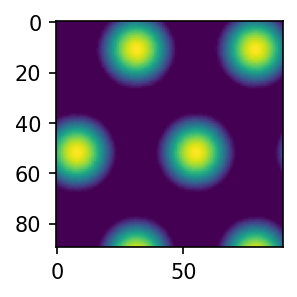

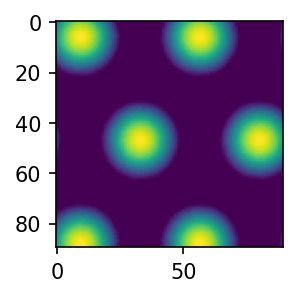

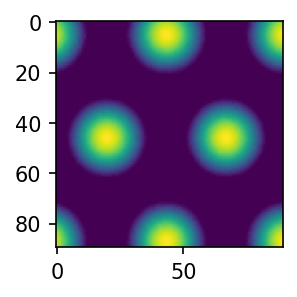

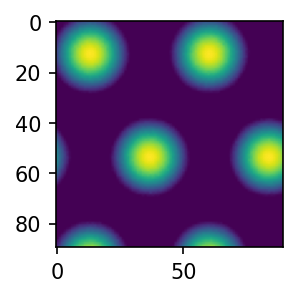

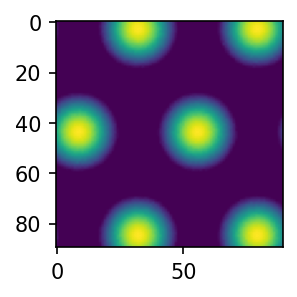

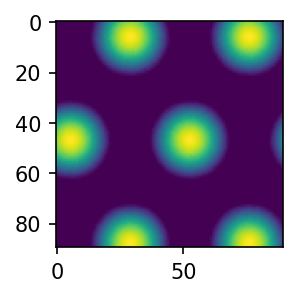

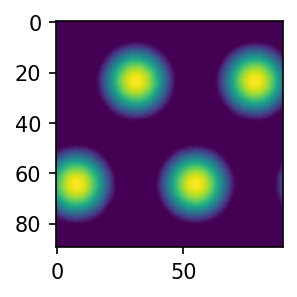

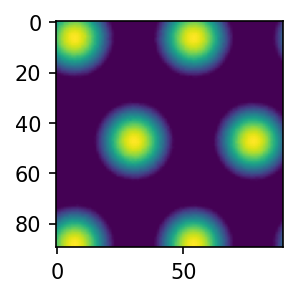

In [34]:
for i in range(10): # show some examples for sanity
    plt.imshow(res.statistic[i])
    plt.show()